In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
import scanorama
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Глобальное окружение

## Подгрузим данные

In [2]:
os.listdir('../../data/anndata_objects/macaque')

['macaque.h5ad',
 'macaque_0701.h5ad',
 'macaque_0703.h5ad',
 'macaque_0704.h5ad',
 'macaque_nb0904.h5ad']

In [3]:
adata = sc.read_h5ad('../../data/anndata_objects/macaque/macaque.h5ad')
adata.obs_names_make_unique()
adata

C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 14621 × 21591
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

Оставим споты только с разметкой

In [4]:
adata = adata[adata.obs.label.notna()]

In [5]:
adata.obs.label.value_counts()

L3             4614
L5             2507
L4             1799
L1             1483
L6a            1351
L2             1196
Empty spots     680
L6b             537
WM              444
Name: label, dtype: int64

In [6]:
samples = list(adata.uns['spatial'].keys())
samples

['macaque_0701', 'macaque_0703', 'macaque_0704', 'macaque_nb0904']

## Посмотрим на изображения

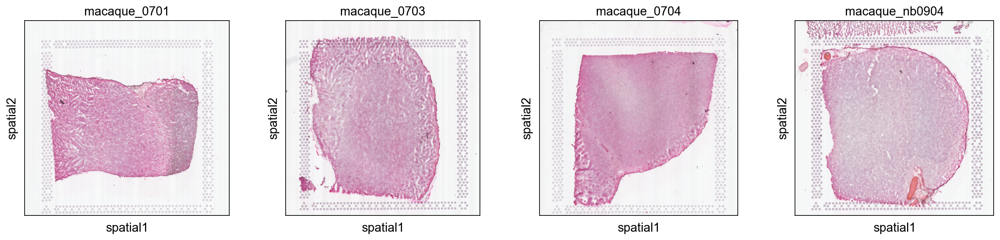

In [7]:
sq.pl.spatial_scatter(adata, library_key='sample_id', title=samples, ncols=5)

C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\compat\_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


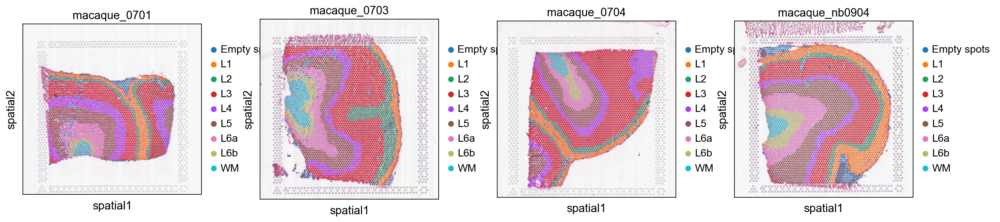

In [8]:
sq.pl.spatial_scatter(adata, color=['label'], library_key='sample_id', size=1.1, ncols=5, title=samples)

## Посмотрим на метрики

In [9]:
# add info on mitochondrial and hemoglobin genes to the objects.
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

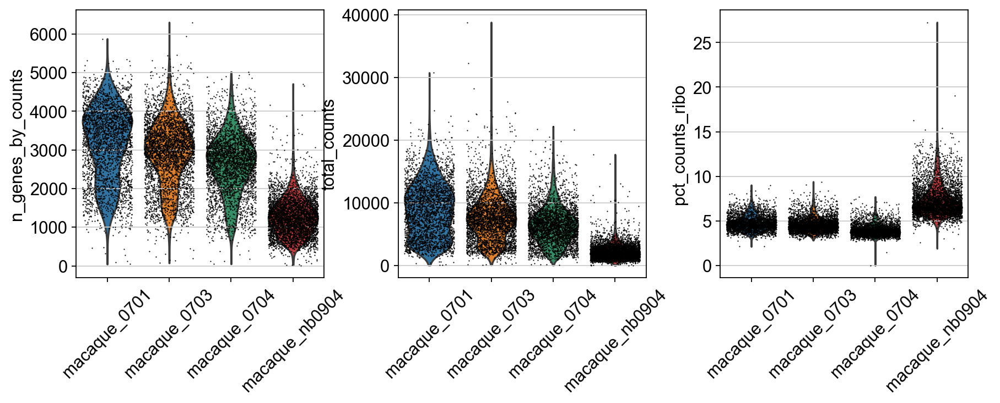

In [10]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo'],
             jitter=0.4, groupby = 'sample_id', rotation= 45)

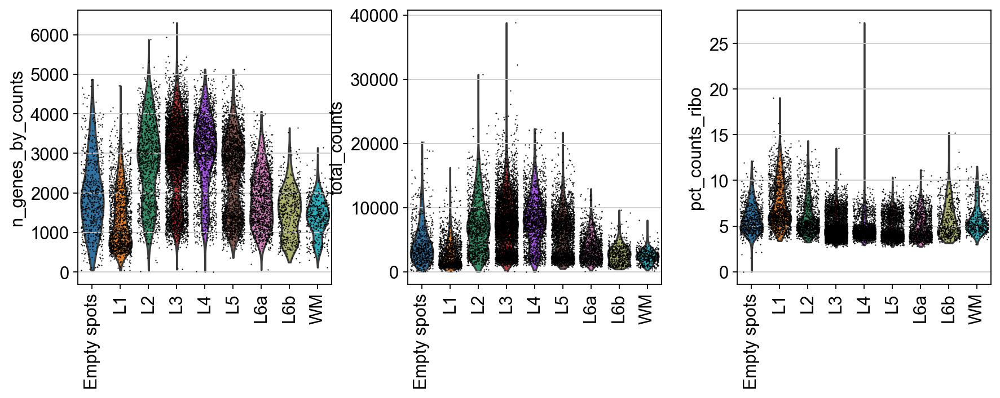

In [11]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo'],
             jitter=0.4, groupby = 'label', rotation= 90)

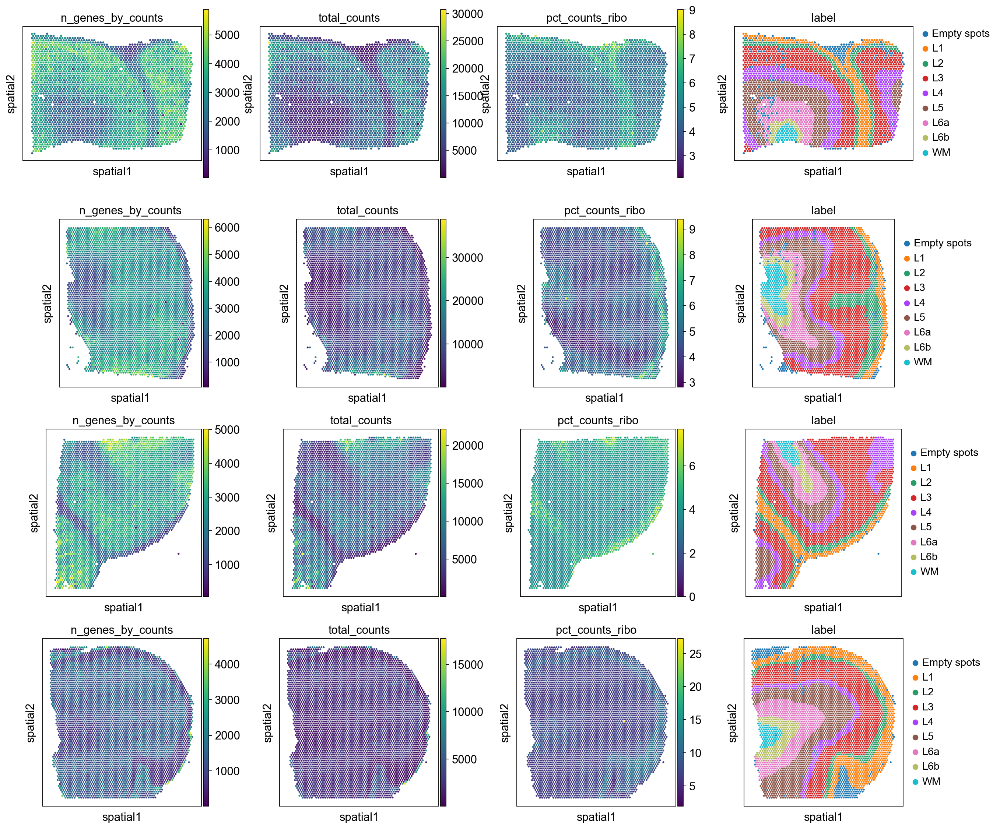

In [12]:
sq.pl.spatial_scatter(adata,
                      color=['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'label'],
                      library_key='sample_id', ncols=4, img=False, size=1.3)

## PCA

In [13]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:02:06)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


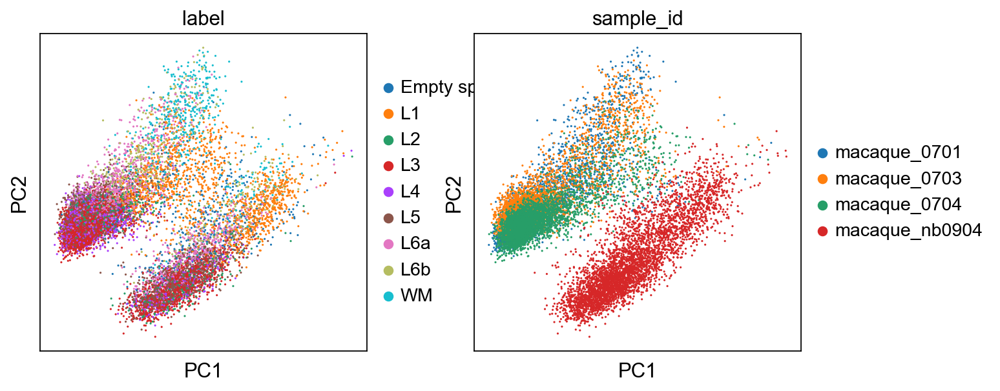

In [14]:
sc.pl.pca(adata, 
          color=['label', 'sample_id'],
          ncols=2, show=True)

### Дифф. экспрессия

In [15]:
remove = adata.var_names.str.startswith('MT-')
keep = np.invert(remove)
print(sum(remove))

adata = adata[:,keep]

0


In [16]:
adata.obs['cluster'] = adata.obs.label
adata.obs.cluster.replace({'L6a': 'L6', 'L6b': 'L6'}, inplace=True)
adata.obs.cluster.value_counts()

C:\Users\aleks\AppData\Local\Temp\ipykernel_8272\737622212.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['cluster'] = adata.obs.label


L3             4614
L5             2507
L6             1888
L4             1799
L1             1483
L2             1196
Empty spots     680
WM              444
Name: cluster, dtype: int64

In [17]:
sc.tl.rank_genes_groups(adata, groupby='cluster', method='wilcoxon', groups=['L1', 'WM', 'L6', 'L2', 'L3', 'L4', 'L5'])

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:35)


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cluster']`


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\compat\_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


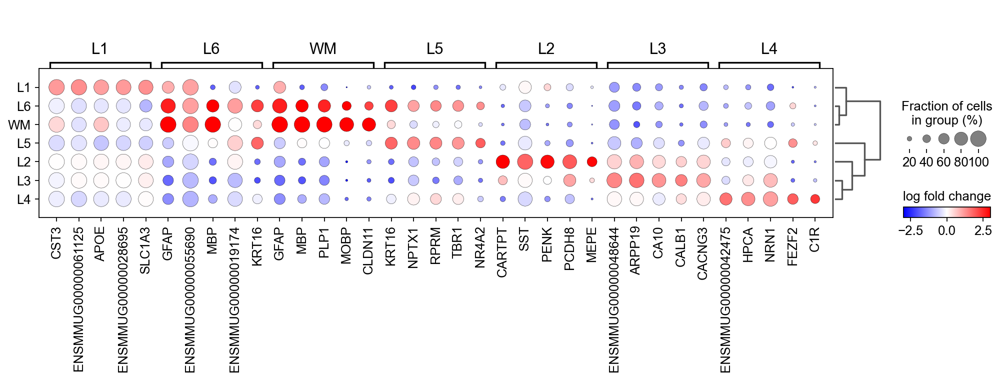

In [18]:
sc.pl.rank_genes_groups_dotplot(adata[adata.obs.cluster != 'Empty spots'],
                                groupby="cluster", n_genes=5, values_to_plot='logfoldchanges',
                                min_logfoldchange=1, vmax=3, vmin=-3, cmap='bwr', save='dotplot_fc_human.pdf')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cluster']`
categories: Empty spots, L1, L2, etc.
var_group_labels: L1, WM, L6, etc.


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


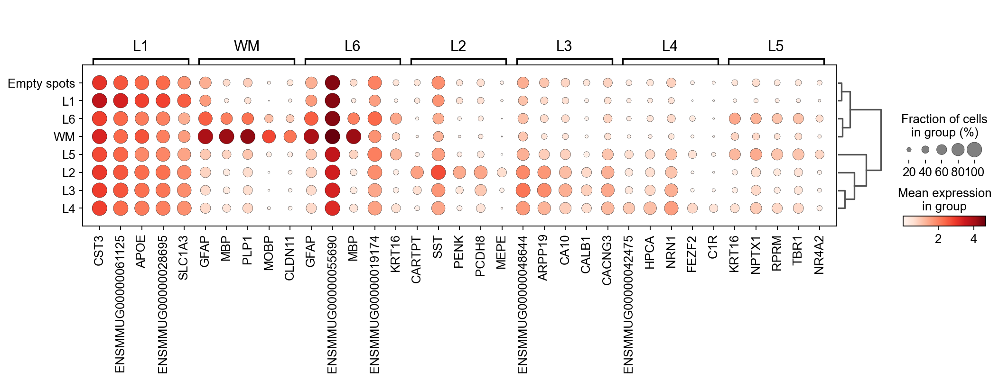

In [19]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, groupby="cluster", min_logfoldchange=1, save='dotplot_expr_human.pdf')

## Spatial features

In [20]:
sq.gr.spatial_neighbors(
    adata, coord_type="generic", library_key="sample_id", delaunay=True
)

Creating graph using `generic` coordinates and `None` transform and `4` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:02)


Calculating neighborhood enrichment using `1` core(s)


  0%|          | 0/1000 [00:00<?, ?/s]

Adding `adata.uns['cluster_nhood_enrichment']`
Finish (0:00:16)


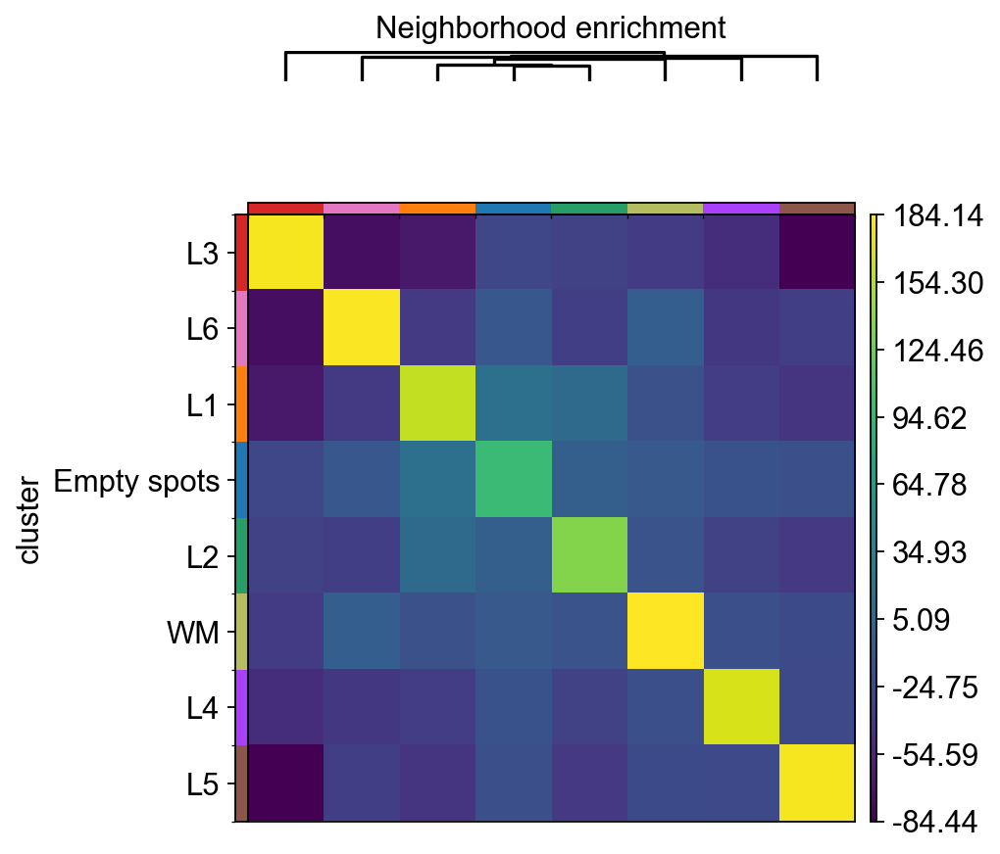

In [21]:
sq.gr.nhood_enrichment(adata, cluster_key="cluster")
sq.pl.nhood_enrichment(adata, cluster_key="cluster", method="average")

In [22]:
sq.gr.spatial_autocorr(adata, mode="moran", genes=adata.var_names)

C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\metrics\_gearys_c.py:293: UserWarning: 4108 variables were constant, will return nan for these.
  warnings.warn(


Calculating moran's statistic for `None` permutations using `1` core(s)
Adding `adata.uns['moranI']`
Finish (0:00:00)


In [23]:
adata.uns["moranI"].head(15)

,I,pval_norm,var_norm,pval_norm_fdr_bh
HBA,0.794582,0.0,0.000023,NaN
ENSMMUG00000060590,0.783832,0.0,0.000023,NaN
ND3,0.777814,0.0,0.000023,NaN
MOBP,0.768438,0.0,0.000023,NaN
MBP,0.752540,0.0,0.000023,NaN
PTGDS,0.685005,0.0,0.000023,NaN
ND2,0.678732,0.0,0.000023,NaN
PLP1,0.656557,0.0,0.000023,NaN
ENSMMUG00000055690,0.644267,0.0,0.000023,NaN
COX3,0.629306,0.0,0.000023,NaN


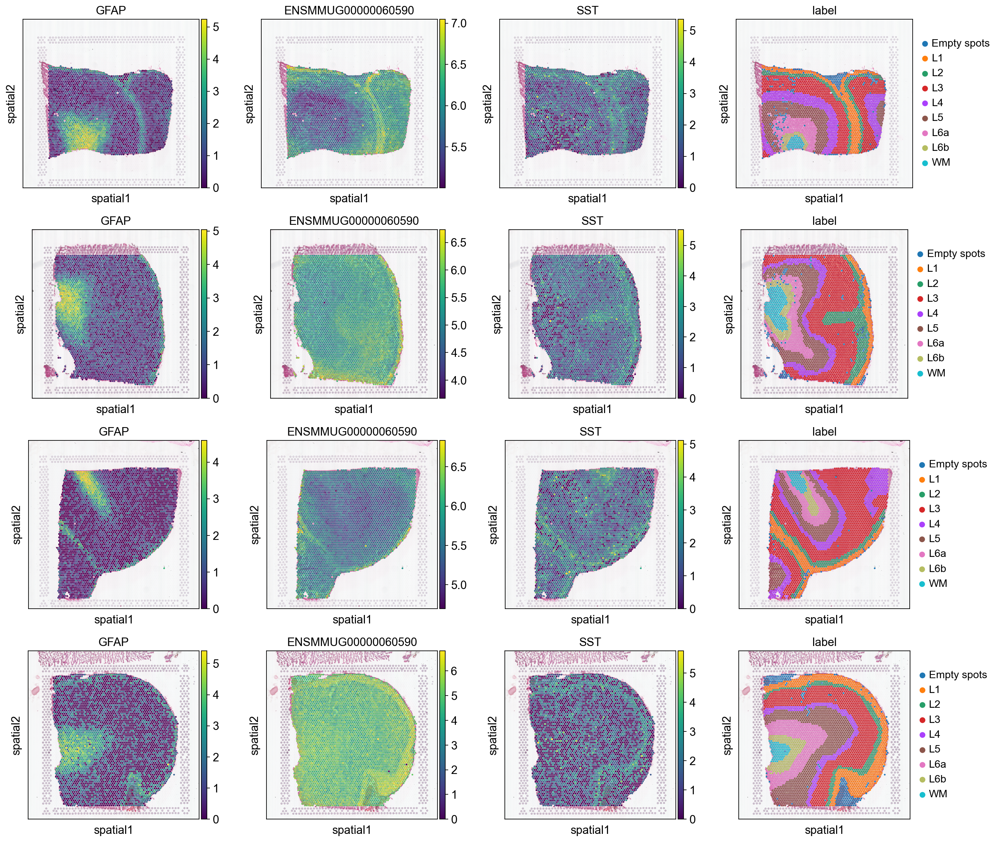

In [26]:
sq.pl.spatial_scatter(adata,
                      color=['GFAP', 'ENSMMUG00000060590', 'SST', 'label'],
                      library_key='sample_id', ncols=4, img=True, size=1.3,
                      save='../figures/markers_human.pdf')